# Automated Image Enhancement

## Integrants

- Juan Fernando Guzmán Castaño
- Cristian Camilo Marin Gonzalez

## 

## General Objetive

Develop a Python-based application that applies multiple image enhance
ment techniques, such as contrast adjustment, noise reduction, and sharpen
ing, to improve the quality of input images

### Specific Objetives

 1. Applying histogram equalization for contrast adjustment.
 2. Implementing noise reduction techniques such as Gaussian blur and
 median filtering.
 3. Enhancing image sharpness using edge detection filters

### First step (**Importing Required Libraries**)

The following Python libraries are imported as the initial step of the program to enable image processing, numerical computation, dataset handling, evaluation, visualization, and file system operations:

1. **OpenCV (`cv2`)**  
   OpenCV (Open Source Computer Vision Library) is a comprehensive computer vision and image processing toolkit.  

2. **NumPy (`np`)**  
   NumPy is a fundamental package for scientific computing in Python.  

3. **KaggleHub (`kagglehub`)**  
   KaggleHub is a library that facilitates easy access to datasets and resources hosted on Kaggle.  

4. **`skimage` (with `exposure`, `filters`, `metrics`)**  
   - **`exposure`**: Contains functions for adjusting image contrast, performing histogram equalization, and managing brightness levels.  
   - **`filters`**: Includes image filtering methods for edge detection, smoothing, and sharpening.  
   - **`metrics`**: Provides image quality assessment tools such as Structural Similarity Index (SSIM), Peak Signal-to-Noise Ratio (PSNR), and Mean Squared Error (MSE).

5. **Matplotlib Pyplot (`plt`)**  
   Matplotlib is a widely used data visualization library, it can visualize those enhancement images.

6. **OS (`os`)**  
   The OS module provides a way to interact with the operating system, it could access and iterate over files in a directory.  

In [1]:
import kagglehub
import cv2
import numpy as np

import matplotlib.pyplot as plt
from skimage import exposure, filters, metrics
import os

### Dataset Source

The dataset used for this project is obtained from **[Kaggle - old-photos](https://www.kaggle.com/datasets/marcinrutecki/old-photos?select=old_photo_18.jpg)**.  
It contains various 29 low-quality images, old photographs that serve as inputs for the enhancement process.

In [4]:
path = kagglehub.dataset_download("marcinrutecki/old-photos")

print("Path to dataset files:", path)

100%|█████████████████████████████████████████████████████████████████████████████| 2.45M/2.45M [00:00<00:00, 6.57MB/s]

Extracting files...
Path to dataset files: C:\Users\cindy\.cache\kagglehub\datasets\marcinrutecki\old-photos\versions\3


### Step-by-Step about Image Enhancement Process

1. **Step 1: Image Loading and Preprocessing**  
   - Each image is read into memory from the specified folder.  
   - The image is converted from its original color format to grayscale to simplify processing.  
   - The grayscale image is resized to a fixed dimension of 256×256 pixels to ensure uniformity across all images.  
   - Pixel values are normalized to a range between 0 and 1 by dividing by 255, which facilitates further processing steps.

2. **Step 2: Contrast Enhancement**  
   - **Histogram Equalization** is applied to improve global contrast, redistributing pixel intensity values for better detail visibility.  
   - **Contrast Limited Adaptive Histogram Equalization (CLAHE)** is also applied as an alternative approach. CLAHE enhances contrast in localized regions while preventing over-amplification of noise.

3. **Step 3: Noise Reduction**  
   - A **Gaussian Blur** filter is applied to reduce random noise while preserving edges moderately.  
   - A **Median Filter** is applied as another noise reduction method, particularly effective at removing salt-and-pepper noise without heavily blurring edges.

4. **Step 4: Sharpness Enhancement**  
   - The **Laplacian operator** is applied to detect edges and enhance structural details.  
   - An **Unsharp Mask** technique is applied, combining the original image with a blurred version to increase edge sharpness and fine details.

5. **Step 5: Image Quality Assessment**  
   - **Structural Similarity Index (SSIM)** is calculated to evaluate how similar the processed image is to the reference, focusing on structural information.  
   - **Peak Signal-to-Noise Ratio (PSNR)** is measured to quantify the ratio between the maximum possible signal and the noise introduced during processing.  
   - **Mean Squared Error (MSE)** is computed to measure the average squared difference between the processed image and the reference.

6. **Visualization**  
   - The original grayscale image, along with all processed versions (Histogram Equalization, CLAHE, Gaussian Blur, Median Filter, and Unsharp Mask), are displayed in a grid layout for visual comparison.


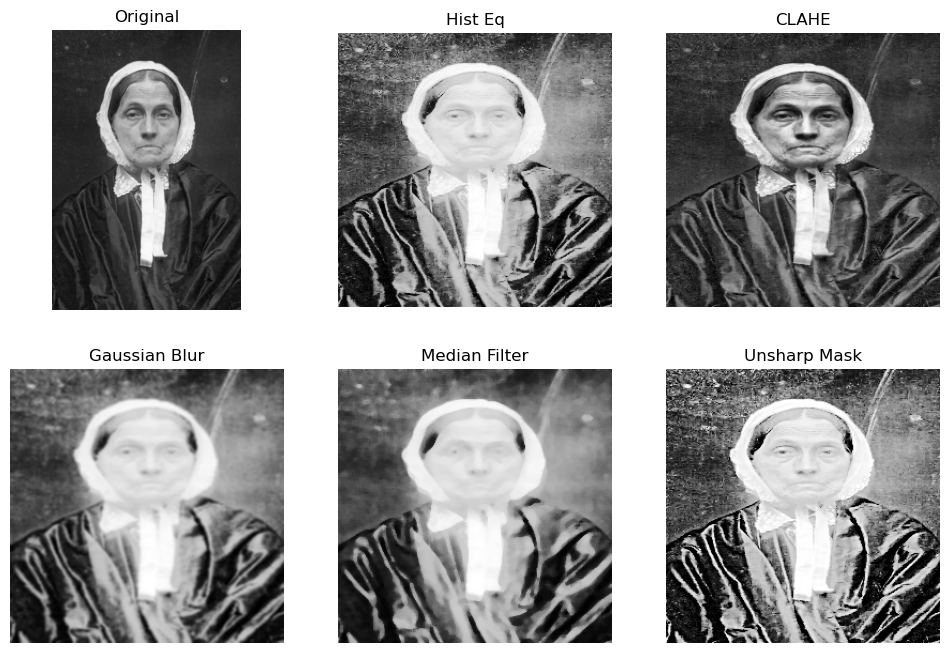

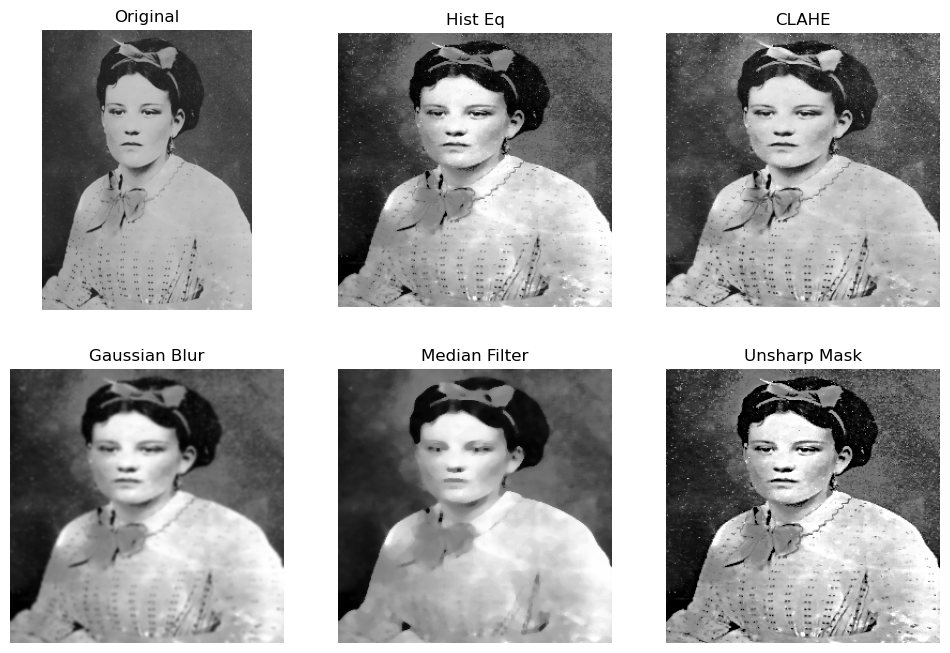

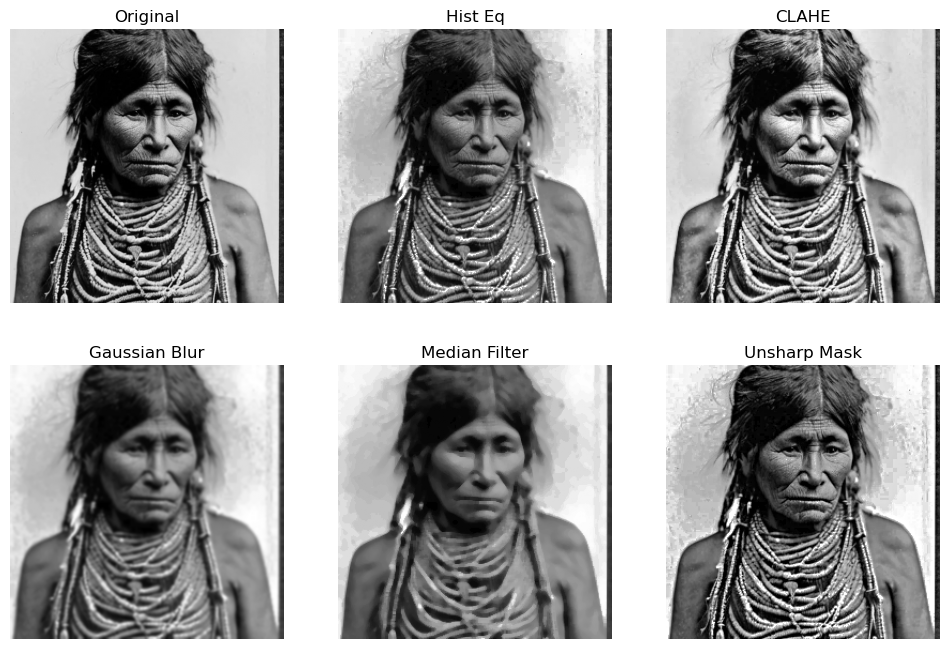

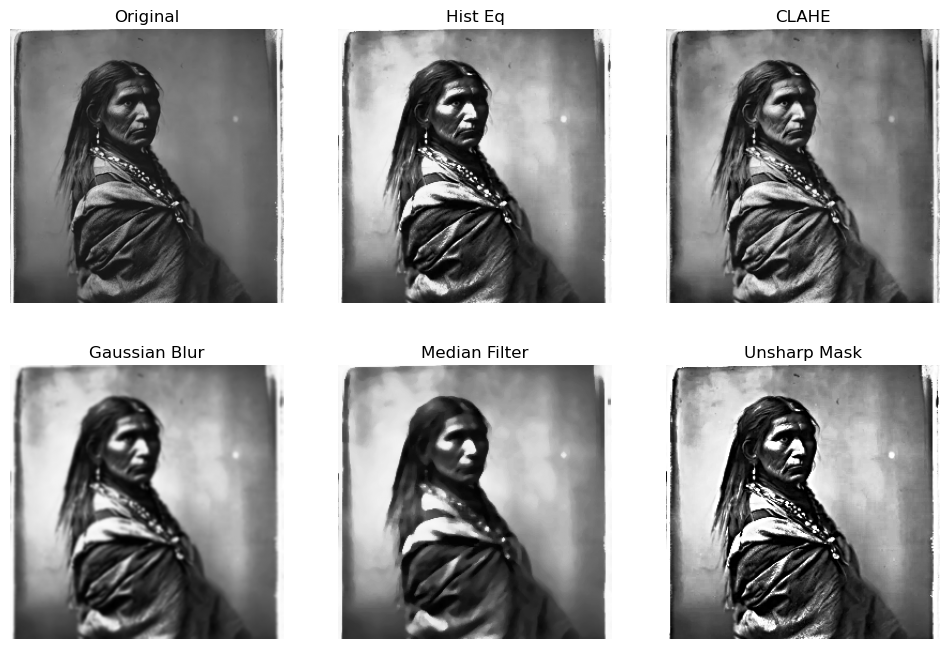

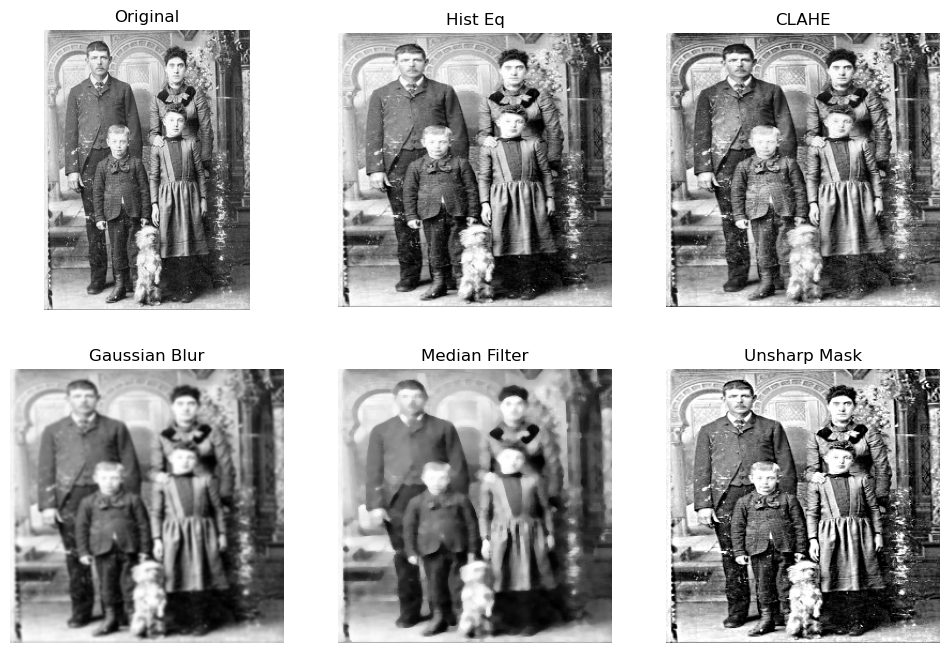

...

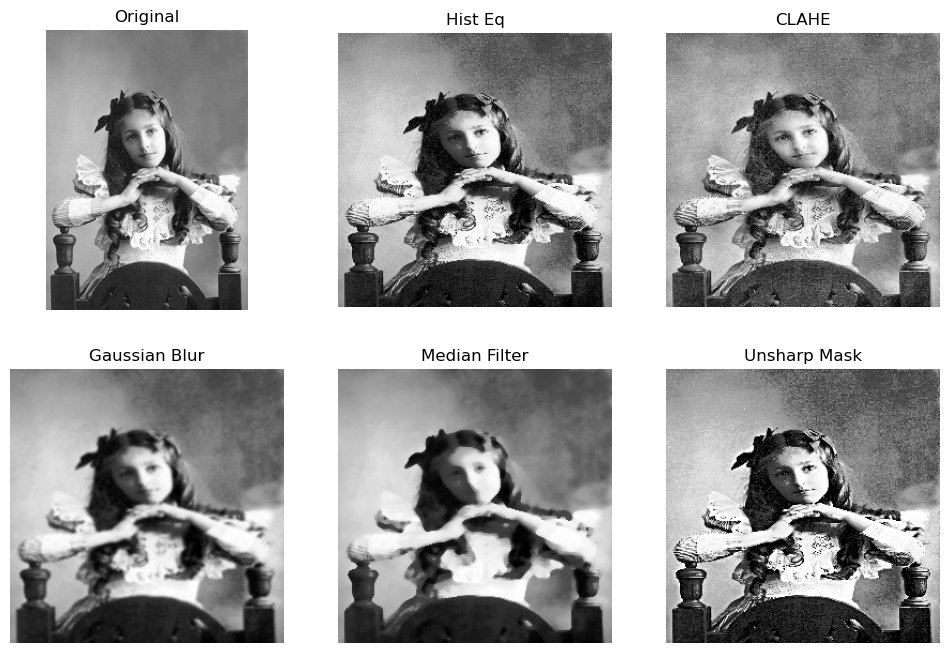

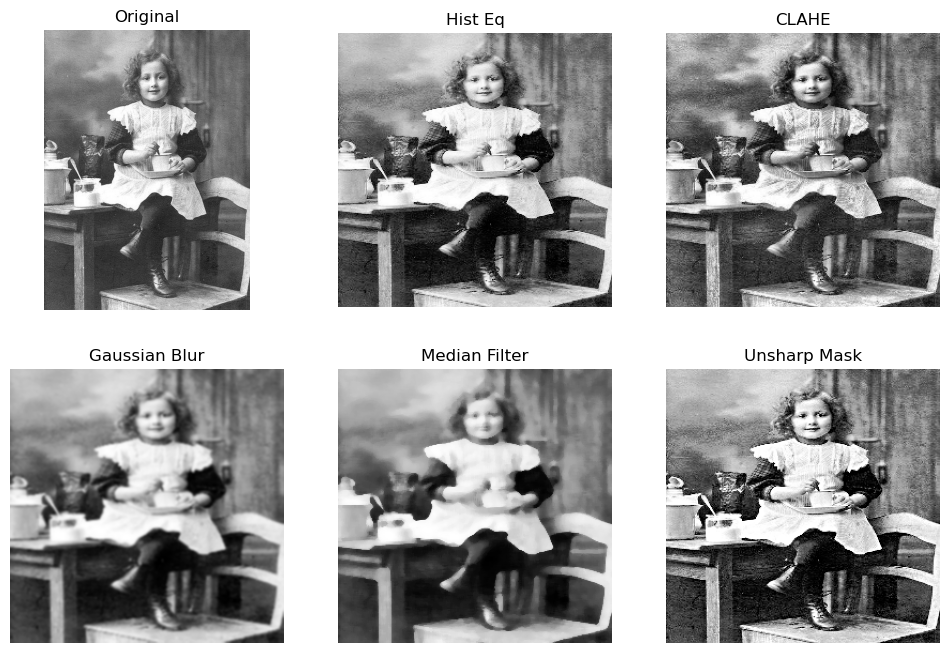

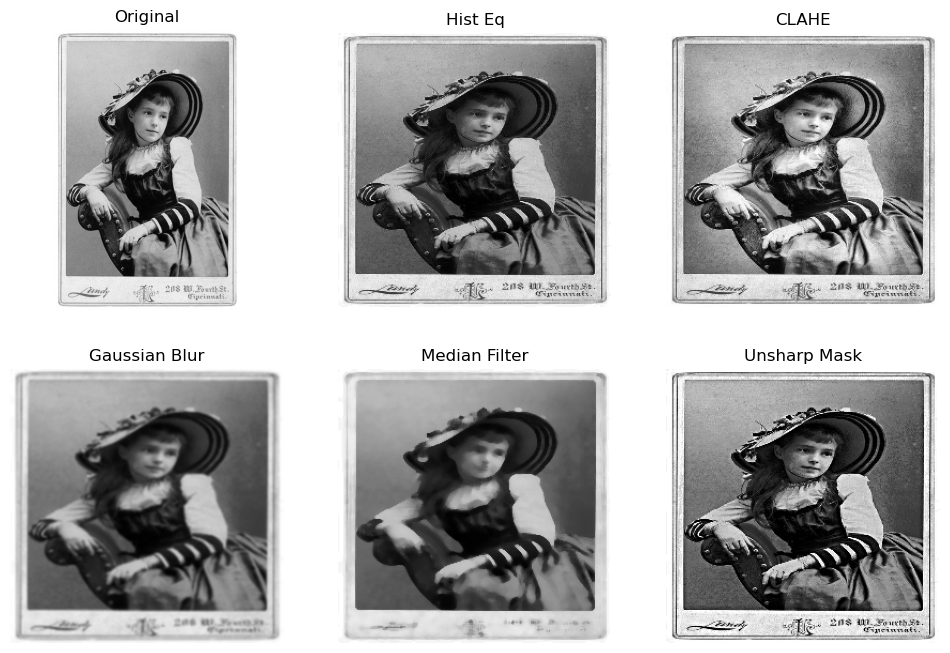

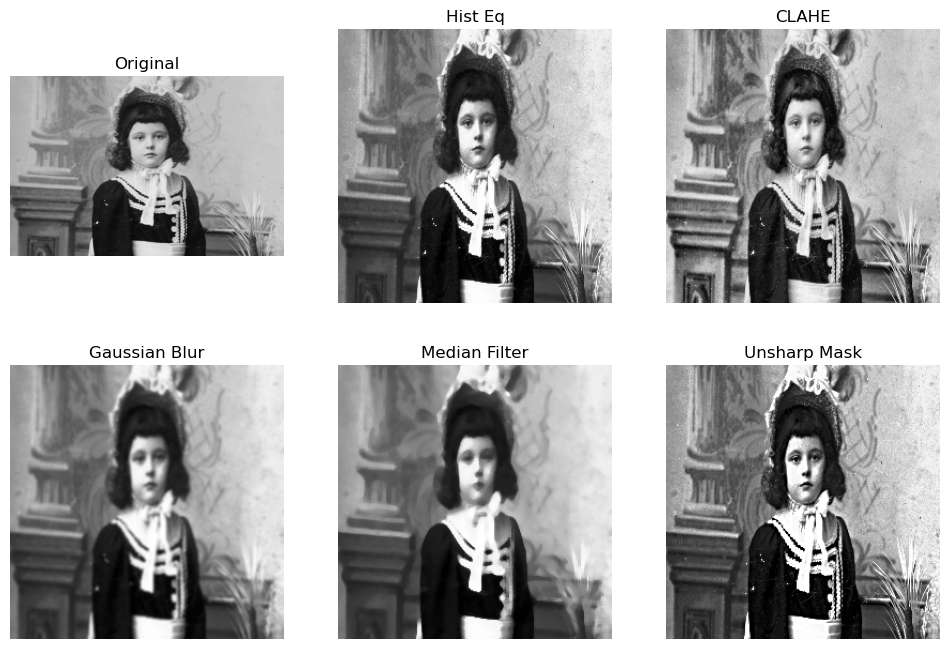

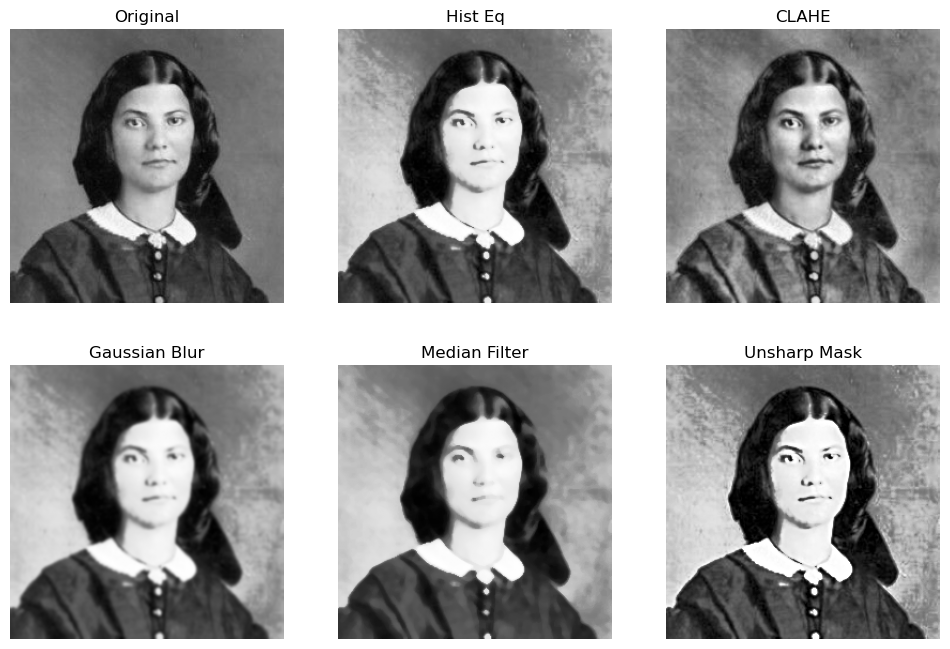

In [11]:
path = os.path.join("images")
images = os.listdir(path)

for img in images:
    # Step 1: Load and preprocessing
    img = cv2.imread(os.path.join(path, img))
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_resized = cv2.resize(img_gray, (256, 256))
    img_norm = img_resized / 255.0

    # Step 2: contrast (histogram equalization)
    hist_eq = cv2.equalizeHist((img_norm * 255).astype(np.uint8))

    # CLAHE
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    clahe_img = clahe.apply((img_norm * 255).astype(np.uint8))

    # Step 3: noise reduction
    gaussian_blur = cv2.GaussianBlur(hist_eq, (5,5), 0)
    median_filtered = cv2.medianBlur(hist_eq, 5)

    # Step 4: sharpness
    laplacian = cv2.Laplacian(gaussian_blur, cv2.CV_64F)
    unsharp_mask = cv2.addWeighted(hist_eq, 1.5, cv2.GaussianBlur(hist_eq, (9,9), 10), -0.5, 0)

    # Step 5: Assessment (SSIM, PSNR, MSE)
    ssim_gaussian = metrics.structural_similarity(hist_eq, gaussian_blur)
    psnr_gaussian = metrics.peak_signal_noise_ratio(hist_eq, gaussian_blur)
    mse_value = metrics.mean_squared_error(hist_eq, gaussian_blur)

    # visualization
    
    plt.figure(figsize=(12,8))
    plt.subplot(231); plt.title("Original"); plt.imshow(img_gray, cmap='gray'); plt.axis('off')
    plt.subplot(232); plt.title("Hist Eq"); plt.imshow(hist_eq, cmap='gray'); plt.axis('off')
    plt.subplot(233); plt.title("CLAHE"); plt.imshow(clahe_img, cmap='gray'); plt.axis('off')
    plt.subplot(234); plt.title("Gaussian Blur"); plt.imshow(gaussian_blur, cmap='gray'); plt.axis('off')
    plt.subplot(235); plt.title("Median Filter"); plt.imshow(median_filtered, cmap='gray'); plt.axis('off')
    plt.subplot(236); plt.title("Unsharp Mask"); plt.imshow(unsharp_mask, cmap='gray'); plt.axis('off')
    plt.show()


### Image Quality Metrics Output

1. **SSIM Gaussian**  
   - Structural similarity between the reference and Gaussian-blurred image.  
   - Range: -1 to 1 (1 = identical).  
   - Displayed with 4 decimal places.

2. **PSNR Gaussian**  
   - Peak Signal-to-Noise Ratio in dB (higher = better).  
   - Shows how much noise was introduced.  
   - Displayed with 2 decimal places.

3. **MSE Value**  
   - Mean Squared Error (lower = better).  
   - Measures average pixel intensity difference.  
   - Displayed with 2 decimal places.

In [3]:
print(f"SSIM Gaussian: {ssim_gaussian:.4f}")
print(f"PSNR Gaussian: {psnr_gaussian:.2f} dB")
print(f"MSE Value: {mse_value:.2f}")

SSIM Gaussian: 0.9493
PSNR Gaussian: 32.10 dB
MSE Value: 40.12


## Results

1. SSIM shows a value close to 1, indicating that the image is similar to the original.
2. PSNR shows a value between 30 dB and 40 dB, meaning the image has good quality.
3. MSE shows a value close to 0, indicating that, on average, pixel intensities differ only slightly from the original.